In [1]:
import os
import sys
sys.path.insert(0, '../utils')
import transfer_utils 
import model_utils
import data_utils

from tqdm import tqdm
import numpy as np
import pandas as pd

import torchsummary
import torchvision
import torch
from transfer_model import NTLModel

import warnings
import logging
warnings.filterwarnings("ignore")
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

import wandb
wandb.init(project="tm-poverty-prediction")

use_gpu = "cuda" if torch.cuda.is_available() else "cpu"
device = torch.device(use_gpu)
print("Using gpu: ", use_gpu)

%load_ext autoreload
%autoreload 2

wandb: Currently logged in as: maszig (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.10.29 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


Using gpu:  cpu


In [ ]:
from PIL import Image
import os, sys


imgdir = r"C:\Users\martin.szigeti\Documents\UN Work\NCE\UNICEF_Imagery_Uganda/"

imgs = os.listdir(imgdir)
for i in range(len(imgs)):
    im = Image.open(imgdir+"/"+imgs[i])
    bg = Image.new("RGB", im.size, (3,400,400))
    bg.paste(im,im)
    bg.save(r"C:\Users\martin.szigeti\Documents\UN Work\NCE\UNICEF_Imagery_Uganda\jpg/{}.jpg".format(i))

In [4]:
class_names =  ['high', 'high medium', 'low', 'low medium', 'medium']

model_file = r"C:\Users\martin.szigeti\Documents\UN Work\Groups\Poverty - Nonpoverty\poverty_master\models\model_best.pt"
model_file_haiti =  r"C:\Users\martin.szigeti\Documents\UN Work\Groups\Poverty - Nonpoverty\poverty_master\models\model_best.pt"

# Instantiate model GPU

model = torchvision.models.vgg16(pretrained=True)
model = NTLModel(model, len(class_names))
if use_gpu == "cuda":
    model = model.cuda()
    
# Load saved model

checkpoint = torch.load(model_file, map_location=torch.device('cpu'))
model.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [27]:
from torchvision import transforms
from PIL import Image 
import os
import gc


# Create the preprocessing transformation here
transform = transforms.ToTensor()


imgdir = r"C:\Users\martin.szigeti\Documents\UN Work\NCE\UNICEF_Imagery_Uganda/jpg/"

imgs = os.listdir(imgdir)
tensorlist = []

for i in tqdm(range(len(imgs)), desc = "Progress:"):
    with torch.no_grad():
        img = Image.open(imgdir+"/"+imgs[i])
        input = transform(img)
        input = input.unsqueeze(0)
        #tensorlist.append(model(input.cuda()))
        tensorlist.append(model(input))

Progress:: 100%|███████████████████████████████████████████████████████████████████| 1019/1019 [19:57<00:00,  1.18s/it]


In [104]:
tensorlist

[tensor([[[[3.4960e-06]],
 
          [[5.9110e-01]],
 
          [[2.1581e-06]],
 
          [[1.2823e-02]],
 
          [[3.9607e-01]]]]),
 tensor([[[[0.0046]],
 
          [[0.0016]],
 
          [[0.3407]],
 
          [[0.0828]],
 
          [[0.5703]]]]),
 tensor([[[[1.7127e-02]],
 
          [[6.2200e-05]],
 
          [[4.7133e-03]],
 
          [[8.7990e-01]],
 
          [[9.8201e-02]]]]),
 tensor([[[[1.5667e-04]],
 
          [[3.9938e-06]],
 
          [[4.0091e-01]],
 
          [[5.9857e-01]],
 
          [[3.6402e-04]]]]),
 tensor([[[[0.0218]],
 
          [[0.0344]],
 
          [[0.0114]],
 
          [[0.9183]],
 
          [[0.0141]]]]),
 tensor([[[[1.0780e-06]],
 
          [[8.7200e-05]],
 
          [[4.2656e-02]],
 
          [[9.5725e-01]],
 
          [[1.4220e-06]]]]),
 tensor([[[[8.8979e-08]],
 
          [[1.0823e-04]],
 
          [[1.6847e-04]],
 
          [[9.9965e-01]],
 
          [[7.6352e-05]]]]),
 tensor([[[[9.9939e-07]],
 
          [[7.0859e-07]],

In [28]:
import torch.nn.functional as F
prob = []

for i in tqdm(range(len(tensorlist)), desc = "Progress:"):
    prob.append(F.softmax(tensorlist[i], dim=1).argmax().item())

Progress:: 100%|████████████████████████████████████████████████████████████████| 1019/1019 [00:00<00:00, 28250.17it/s]


In [29]:
# make dataframe with prediction outcome and image for reference (lat lon)
cn = []

for i in tqdm(range(len(prob)), desc = "Progress:"):
    cn.append(class_names[prob[i]])

Progress:: 100%|██████████████████████████████████████████████████████████████| 1019/1019 [00:00<00:00, 1022731.70it/s]


In [105]:
F.softmax(tensorlist[1], dim=1)

tensor([[[[0.1603]],

         [[0.1598]],

         [[0.2243]],

         [[0.1733]],

         [[0.2822]]]])

In [107]:
tensorlist[1]

tensor([[[[0.0046]],

         [[0.0016]],

         [[0.3407]],

         [[0.0828]],

         [[0.5703]]]])

In [122]:
tensorlist[1][0][1]

tensor([[0.0016]])

In [ ]:
new_string = [i.replace(".jpg", "") for i in imgs]
lat = [i.split("_", 1)[0] for i in new_string]
lon = [i.split("_", 1)[1] for i in new_string]

In [ ]:
cn

In [33]:
df = pd.DataFrame(
    {'classname': cn,
     'image_name': imgs[:len(cn)],
     #'lat': lat,
     #'lon': lon
    })

In [ ]:
df["classname"].mean()

In [39]:
df.to_csv(r"C:\Users\martin.szigeti\Documents\UN Work\NCE\UNICEF_Imagery_Uganda/"+"classification_haiti.csv")

In [43]:
im = Image.open(imgdir+"/"+imgs[1])
im

In [90]:
from PIL import Image 
imgs = os.listdir(imgdir)
im = []
for i in range(len(imgs)):
    im.append(Image.open(imgdir+"/"+imgs[i]))

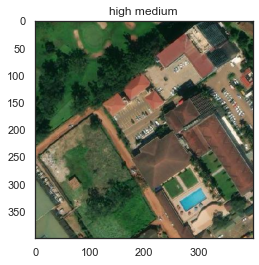

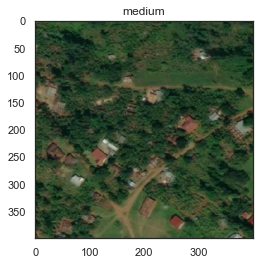

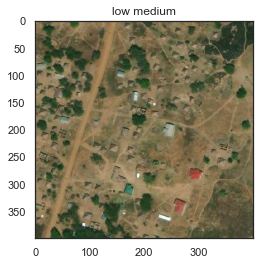

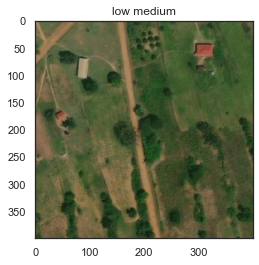

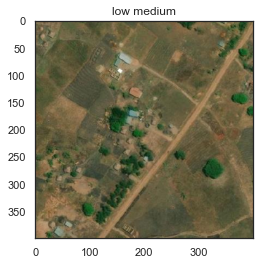

...

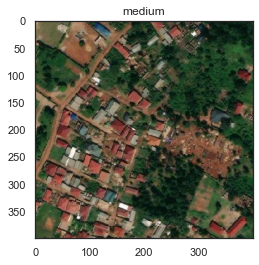

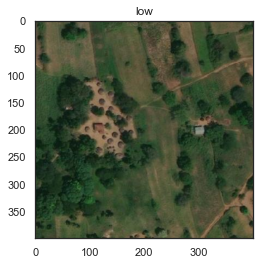

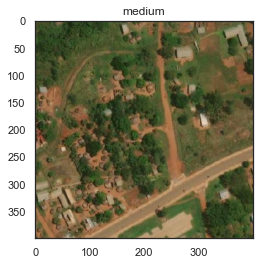

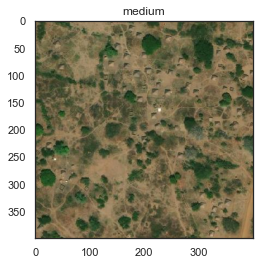

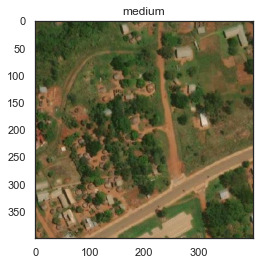

In [102]:

for i, img in enumerate(im[0:100]):
    plt.figure()
    plt.title(cn[i])
    plt.imshow(img)

In [ ]:
(imgdir+"/"+imgs[1]).imshow

In [ ]:
plt.figure(figsize=(20,10))
columns = 5
for i, image in enumerate(imglist):
    plt.subplot(len(imglist) / columns + 1, columns, i + 1)
    plt.imshow(image)

In [ ]:
plotimgs(imglist)

In [ ]:
imglist

In [57]:
imgs = os.listdir(imgdir)

In [61]:
imglist = [imgdir + img for img in imgs]